# Importing Libararies

In [ ]:
import string
import pandas as pd
import numpy as np

from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# Importing Dataset

In [2]:
formspring_dataset = pd.read_csv("Formspring.csv")

print("First 10 Elements from the 'Dataset - Formspring.csv':")
print('-' * 63)
formspring_dataset.head(10)

NameError: name 'pd' is not defined

In [ ]:
print("Last 10 Elements from the 'Dataset - Formspring.csv':")
print('-' * 63)
formspring_dataset.tail(10)

Last 10 Elements from the 'Dataset - Formspring.csv':
---------------------------------------------------------------


,text,answer
13137,Q: Your bio says &quot;Always ready for advent...,No
13138,Q: your going to mcdonalds what do you order ...,No
13139,Q: Your home alone. 2 robbers (of the opposite...,No
13140,Q: Your parents are divorced. One of them gets...,No
13141,Q: your thoughts on 2012? I think it&#039;ll b...,No
13142,Q: Youre at a party and your friend who drove ...,No
13143,Q: Youu2019re awesome :] Give yourself a compl...,No
13144,Q: Yu play with yurself ?<br>A: all the time. ...,No
13145,Q: yukk beer is disgusting. i can only drink i...,No
13146,Q: if i told u den it would make it all the le...,No


In [ ]:
print(f"The 'Dataset - Formspring.csv' has {formspring_dataset.shape[0]:,} Rows and "\
      f"{formspring_dataset.shape[1]} Columns.")

The 'Dataset - Formspring.csv' has 13,147 Rows and 2 Columns.


In [ ]:
formspring_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13147 entries, 0 to 13146
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    13147 non-null  object
 1   answer  13147 non-null  object
dtypes: object(2)
memory usage: 205.5+ KB


In [ ]:
print("A generate descriptive statistics from the 'Dataset - Formspring.csv':")
print('-' * 73)
formspring_dataset.describe()

A generate descriptive statistics from the 'Dataset - Formspring.csv':
-------------------------------------------------------------------------


,text,answer
count,13147,13147
unique,13144,2
top,Q: Wait. Are you Cheyenne? I sent a request to...,No
freq,3,12295


In [ ]:
print("Detecting missing values from the 'Dataset - Formspring.csv':")
print('-' * 63)
print(formspring_dataset.isnull().sum())

Detecting missing values from the 'Dataset - Formspring.csv':
---------------------------------------------------------------
text      0
answer    0
dtype: int64


In [ ]:
print("A Value Count for the 'Element - answer', from the 'Dataset - Formspring.csv':")
print('-' * 83)
formspring_dataset["answer"].value_counts()

A Value Count for the 'Element - answer', from the 'Dataset - Formspring.csv':
-----------------------------------------------------------------------------------


No     12295
Yes      852
Name: answer, dtype: int64

In [ ]:
formspring_text_features = formspring_dataset["text"].copy()
tfid_vectorizer = TfidfVectorizer(encoding="english")
formspring_features = tfid_vectorizer.fit_transform(formspring_text_features)

print("Text Features from the 'Dataset - Formspring.csv':")
print('-' * 63)
print(formspring_text_features)

Text Features from the 'Dataset - Formspring.csv':
---------------------------------------------------------------
0        Q: what&#039;s your favorite song? :D<br>A: I ...
1                           Q: <3<br>A: </3 ? haha jk! <33
2        Q: &quot;hey angel  you duh sexy&quot;<br>A: R...
3                                           Q: (:<br>A: ;(
4        Q: ******************MEOWWW*******************...
                               ...                        
13142    Q: Youre at a party and your friend who drove ...
13143    Q: Youu2019re awesome :] Give yourself a compl...
13144    Q: Yu play with yurself ?<br>A: all the time. ...
13145    Q: yukk beer is disgusting. i can only drink i...
13146    Q: if i told u den it would make it all the le...
Name: text, Length: 13147, dtype: object


In [ ]:
print("Features from the 'Dataset - Formspring.csv':")
print('-' * 53)
print(formspring_features)

Features from the 'Dataset - Formspring.csv':
-----------------------------------------------------
  (0, 7574)	0.17265193864975523
  (0, 16619)	0.13666204960704684
  (0, 15135)	0.43794630875263
  (0, 10321)	0.30068023170403524
  (0, 16688)	0.26377533756496274
  (0, 9775)	0.19038717708585326
  (0, 2417)	0.06294444269439241
  (0, 15130)	0.3373860496444202
  (0, 6020)	0.5901629635353193
  (0, 18614)	0.16445580974678042
  (0, 4)	0.21166783975854714
  (0, 17947)	0.15984947496542218
  (1, 212)	0.6183066126040023
  (1, 8965)	0.6831137869399059
  (1, 7324)	0.3741534117644445
  (1, 2417)	0.10517467075209345
  (2, 16303)	0.2732437598936449
  (2, 13501)	0.21324964843482594
  (2, 14472)	0.33719738619651285
  (2, 5157)	0.42483910836891386
  (2, 18600)	0.08652593712503841
  (2, 1044)	0.438159096799631
  (2, 7765)	0.28865473977444867
  (2, 13327)	0.5094343603709675
  (2, 7324)	0.2004543755406245
  :	:
  (13145, 8747)	0.17732454301599979
  (13145, 15864)	0.16915866497268883
  (13145, 7324)	0.12446056

In [ ]:
saved_formspring_df = pd.DataFrame(formspring_text_features)

saved_formspring_df.to_csv("Formspring Text Features.csv")

In [ ]:
from sklearn.preprocessing import LabelEncoder


# Get specific column name:
column = ["answer"]

print("Column:", column)

Column: ['answer']


In [ ]:
label_encoder = LabelEncoder()

for i in column:
    # print(i)

    formspring_dataset[i] = label_encoder.fit_transform(formspring_dataset[i])

print("Formspring Dataset Data Types:")
print('-' * 33)
print(formspring_dataset.dtypes)

Formspring Dataset Data Types:
---------------------------------
text      object
answer     int64
dtype: object


In [ ]:
print("First 10 Elements from the 'Dataset - Formspring.csv':")
print('-' * 63)
formspring_dataset.head(10)

First 10 Elements from the 'Dataset - Formspring.csv':
---------------------------------------------------------------


,text,answer
0,Q: what&#039;s your favorite song? :D<br>A: I ...,0
1,Q: <3<br>A: </3 ? haha jk! <33,0
2,Q: &quot;hey angel you duh sexy&quot;<br>A: R...,0
3,Q: (:<br>A: ;(,0
4,Q: ******************MEOWWW*******************...,0
5,Q: any makeup tips? i suck at doing my makeup ...,0
6,Q: Apriiiiiiiiiiiill!!! I miss uuuu! It&#039;s...,0
7,Q: Are you a morning or night person?<br>A: Ni...,0
8,Q: are you a trusting person?<br>A: alreadi an...,0
9,Q: are you a trusting person?<br>A: Yes veryy ...,0


In [ ]:
print("Last 10 Elements from the 'Dataset - Formspring.csv':")
print('-' * 63)
formspring_dataset.tail(10)

Last 10 Elements from the 'Dataset - Formspring.csv':
---------------------------------------------------------------


,text,answer
13137,Q: Your bio says &quot;Always ready for advent...,0
13138,Q: your going to mcdonalds what do you order ...,0
13139,Q: Your home alone. 2 robbers (of the opposite...,0
13140,Q: Your parents are divorced. One of them gets...,0
13141,Q: your thoughts on 2012? I think it&#039;ll b...,0
13142,Q: Youre at a party and your friend who drove ...,0
13143,Q: Youu2019re awesome :] Give yourself a compl...,0
13144,Q: Yu play with yurself ?<br>A: all the time. ...,0
13145,Q: yukk beer is disgusting. i can only drink i...,0
13146,Q: if i told u den it would make it all the le...,0


<br>

To ensure that you have a unique dataset, replace random_state = '0' with the 'last 4 digits of your student number'.

In [ ]:
formspring_features_train, formspring_features_test, formspring_labels_train, \
formspring_labels_test = train_test_split(
    formspring_features,
    formspring_dataset["answer"],
    test_size=0.3,
    random_state=4861
)

In [ ]:
print("Features Train from the 'Dataset - Formspring.csv':")
print('-' * 53)

print(formspring_features_train)

Features Train from the 'Dataset - Formspring.csv':
-----------------------------------------------------
  (0, 1905)	0.3480467073756056
  (0, 12703)	0.6468133399762014
  (0, 13058)	0.26801765201244987
  (0, 16149)	0.26280618295286606
  (0, 15542)	0.16819394890336756
  (0, 2720)	0.10971778532157817
  (0, 8079)	0.11654039500223602
  (0, 2859)	0.12741497551261466
  (0, 8361)	0.11959751173117251
  (0, 12620)	0.4254544835107159
  (0, 4873)	0.08636409381158047
  (0, 9348)	0.12154826875015334
  (0, 10481)	0.10405181432957192
  (0, 9954)	0.10429408251589234
  (0, 18600)	0.05458649651032585
  (0, 16619)	0.07718029577394414
  (0, 2417)	0.03554805974627196
  (1, 17387)	0.4253356997544498
  (1, 11350)	0.3782862925528753
  (1, 8997)	0.36395508962765677
  (1, 18526)	0.3199978896093582
  (1, 12013)	0.28504038186951564
  (1, 17611)	0.4186836846730796
  (1, 15567)	0.2641370614165871
  (1, 14338)	0.23073939557861475
  :	:
  (9201, 11044)	0.11432446663981545
  (9201, 2720)	0.07906299721588791
  (9201, 8

In [ ]:
print("Features Test from the 'Dataset - Formspring.csv':")
print('-' * 53)
print(formspring_features_test)

Features Test from the 'Dataset - Formspring.csv':
-----------------------------------------------------
  (0, 17272)	0.7128390919511512
  (0, 757)	0.5432942623741092
  (0, 11539)	0.43485669417616285
  (0, 2417)	0.08712880687700382
  (1, 17208)	0.29425790611151825
  (1, 12181)	0.29425790611151825
  (1, 14221)	0.27342585784182416
  (1, 3629)	0.2566070011347451
  (1, 10027)	0.2380022155538039
  (1, 8368)	0.20738982720046778
  (1, 14798)	0.21092971303274186
  (1, 512)	0.22505533969037178
  (1, 6403)	0.22505533969037178
  (1, 1921)	0.2889582677005953
  (1, 3903)	0.13291715376796753
  (1, 15258)	0.19520386014948368
  (1, 12344)	0.11916159343785465
  (1, 876)	0.22116415535751957
  (1, 16329)	0.08283111522658118
  (1, 18273)	0.16274762366610543
  (1, 16341)	0.2628226630923011
  (1, 18621)	0.16109284100498453
  (1, 18166)	0.09985247028149881
  (1, 8434)	0.08303028290530448
  (1, 8720)	0.08034314350188489
  :	:
  (3942, 15058)	0.08692984956081279
  (3942, 11716)	0.07759434456668152
  (3942, 995

In [ ]:
print("First 10 Elements from Formspring Labels Train:")
print('-' * 53)
formspring_labels_train.head(10)

First 10 Elements from Formspring Labels Train:
-----------------------------------------------------


5634     0
3350     0
8939     0
5109     0
1001     0
5754     0
12939    0
7619     0
5705     0
10248    0
Name: answer, dtype: int64

In [ ]:
print("Last 10 Elements from Formspring Labels Train:")
print('-' * 53)
formspring_labels_train.tail(10)

Last 10 Elements from Formspring Labels Train:
-----------------------------------------------------


3054     0
4392     0
10829    0
9085     0
2704     1
4125     0
9563     0
9813     0
12745    0
2101     0
Name: answer, dtype: int64

In [ ]:
print("First 10 Elements from Formspring Labels Test:")
print('-' * 53)
formspring_labels_test.head(10)

First 10 Elements from Formspring Labels Test:
-----------------------------------------------------


623      0
9971     0
10347    0
8597     0
3371     0
11076    0
10181    0
13026    0
1163     0
3325     0
Name: answer, dtype: int64

In [ ]:
print("Last 10 Elements from Formspring Labels Test:")
print('-' * 53)
formspring_labels_test.tail(10)

Last 10 Elements from Formspring Labels Test:
-----------------------------------------------------


6376     0
5645     0
54       0
9025     0
11808    0
7440     0
9434     0
2928     0
7176     0
7887     0
Name: answer, dtype: int64

In [ ]:
from sklearn.model_selection import GridSearchCV

from sklearn.svm import (SVR, SVC)
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import (Ridge, RidgeClassifier, SGDRegressor, SGDClassifier, LogisticRegression)
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    classification_report
)

from matplotlib import style
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [ ]:
# ----------------------------- Metric Scores: C-Support Vector Classification ----------------------------- #
svc = SVC(kernel="sigmoid", gamma=1.0)

svc.fit(formspring_features_train, formspring_labels_train)

svc_prediction = svc.predict(formspring_features_test)
svc_accuracy_score = accuracy_score(formspring_labels_test, svc_prediction)
svc_precision_score = precision_score(formspring_labels_test, svc_prediction)
svc_recall_score = recall_score(formspring_labels_test, svc_prediction)
svc_f1_score = f1_score(formspring_labels_test, svc_prediction)
# ---------------------------------------------------------------------------------------------------------- #
# -------------------------------------- Metric Scores: MultinomialNB -------------------------------------- #
mnb = MultinomialNB(alpha=0.2)

mnb.fit(formspring_features_train, formspring_labels_train)

mnb_prediction = mnb.predict(formspring_features_test)
mnb_accuracy_score = accuracy_score(formspring_labels_test, mnb_prediction)
mnb_precision_score = precision_score(formspring_labels_test, mnb_prediction)
mnb_recall_score = recall_score(formspring_labels_test, mnb_prediction)
mnb_f1_score = f1_score(formspring_labels_test, mnb_prediction)
# ---------------------------------------------------------------------------------------------------------- #
# --------------------------------- Metric Scores: DecisionTreeClassifier ---------------------------------- #
dtc = DecisionTreeClassifier()

dtc.fit(formspring_features_train, formspring_labels_train)

dtc_prediction = dtc.predict(formspring_features_test)
dtc_accuracy_score = accuracy_score(formspring_labels_test, dtc_prediction)
dtc_precision_score = precision_score(formspring_labels_test, dtc_prediction)
dtc_recall_score = recall_score(formspring_labels_test, dtc_prediction)
dtc_f1_score = f1_score(formspring_labels_test, dtc_prediction)
# ---------------------------------------------------------------------------------------------------------- #
print(f"""________Evaluation for: C-Support Vector Classification________
Model Type:         {svc}
Accuracy Score:     {svc_accuracy_score:%}
Precision Score:    {svc_precision_score:%}
Recall Score:       {svc_recall_score:%}
F1-Score:           {svc_f1_score:%}

C-Support Vector Classification - Confusion Matrix:
{confusion_matrix(formspring_labels_test, svc_prediction)}

C-Support Vector Classification - Classification Report:
{classification_report(formspring_labels_test, svc_prediction)}
----------------------------THE END----------------------------
______Evaluation for: Multinomial Naive Bayes Classifier_______
Model Type:         {mnb}
Accuracy Score:     {mnb_accuracy_score:%}
Precision Score:    {mnb_precision_score:%}
Recall Score:       {mnb_recall_score:%}
F1-Score:           {mnb_f1_score:%}

C-Support Vector Classification - Confusion Matrix:
{confusion_matrix(formspring_labels_test, mnb_prediction)}

C-Support Vector Classification - Classification Report:
{classification_report(formspring_labels_test, mnb_prediction)}
----------------------------THE END----------------------------
___________Evaluation for: Decision Tree Classifier____________
Model Type:         {dtc}
Accuracy Score:     {dtc_accuracy_score:%}
Precision Score:    {dtc_precision_score:%}
Recall Score:       {dtc_recall_score:%}
F1-Score:           {dtc_f1_score:%}

C-Support Vector Classification - Confusion Matrix:
{confusion_matrix(formspring_labels_test, dtc_prediction)}

C-Support Vector Classification - Classification Report:
{classification_report(formspring_labels_test, dtc_prediction)}
----------------------------THE END----------------------------""")
# ---------------------------------------------------------------------------------------------------------- #

________Evaluation for: C-Support Vector Classification________
Model Type:         SVC(gamma=1.0, kernel='sigmoid')
Accuracy Score:     95.082383%
Precision Score:    80.519481%
Recall Score:       25.726141%
F1-Score:           38.993711%

C-Support Vector Classification - Confusion Matrix:
[[3689   15]
 [ 179   62]]

C-Support Vector Classification - Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      3704
           1       0.81      0.26      0.39       241

    accuracy                           0.95      3945
   macro avg       0.88      0.63      0.68      3945
weighted avg       0.94      0.95      0.94      3945

----------------------------THE END----------------------------
______Evaluation for: Multinomial Naive Bayes Classifier_______
Model Type:         MultinomialNB(alpha=0.2)
Accuracy Score:     94.017744%
Precision Score:    53.623188%
Recall Score:       15.352697%
F1-Score:           23.87096

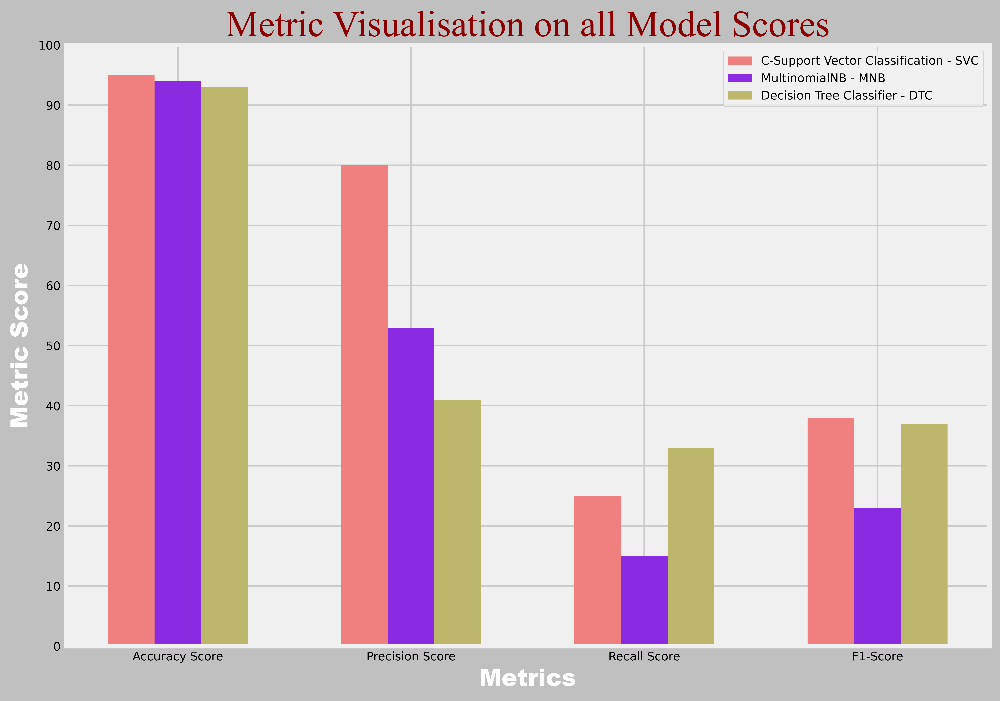

End of the Workshop 02.


In [ ]:
svc_scores = (
    int(svc_accuracy_score * 100),
    int(svc_precision_score * 100),
    int(svc_recall_score * 100),
    int(svc_f1_score * 100)
)
mnb_scores = (
    int(mnb_accuracy_score * 100),
    int(mnb_precision_score * 100),
    int(mnb_recall_score * 100),
    int(mnb_f1_score * 100)
)
dtc_scores = (
    int(dtc_accuracy_score * 100),
    int(dtc_precision_score * 100),
    int(dtc_recall_score * 100),
    int(dtc_f1_score * 100)
)
x_grid = ["Accuracy Score", "Precision Score", "Recall Score", "F1-Score"]
y_grid = [value for value in range(0, 105, 10)]
xpos = np.arange(len(x_grid))
bar_width = .2

style.use("fivethirtyeight")
plt.rcParams['font.size'] = 8
plt.figure(figsize=(10, 7), dpi=700, facecolor="silver")
plt.title(  # Add a title to the graph (specify font parameters with the Argument: fontdict).
    "Metric Visualisation on all Model Scores",
    fontdict={
        "fontname": "Times New Roman",
        "fontsize": 25
    },
    color="darkred"
)
plt.bar(xpos, svc_scores, width=bar_width, color="lightcoral", label="C-Support Vector Classification (SVC)")
plt.bar((xpos + 0.2), mnb_scores, width=bar_width, color="blueviolet", label="MultinomialNB (MNB)")
plt.bar((xpos + 0.4), dtc_scores, width=bar_width, color="darkkhaki", label="Decision Tree Classifier (DTC)")
plt.xlabel(  # Just like the "Function: plt.title()", this gives a title to the X-Axis.
    "Metrics",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.xticks((xpos + 0.2), x_grid)
plt.ylabel(  # Just like the "Function: plt.title()", this gives a title to the Y-Axis.
    "Metric Score",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.yticks(y_grid)
plt.legend()
plt.savefig("Workshop 2 - Graph.jpg", dpi=700)
plt.show()

print("End of the Workshop 02.")

<br>
<br>

## __<center><u>Assessment</u></center>__

In [ ]:
formspring_df = pd.read_csv("Formspring.csv")

print("First 10 Elements from the 'Dataset - Formspring.csv':")
print('-' * 63)
formspring_df[:10]

First 10 Elements from the 'Dataset - Formspring.csv':
---------------------------------------------------------------


,text,answer
0,Q: what&#039;s your favorite song? :D<br>A: I ...,No
1,Q: <3<br>A: </3 ? haha jk! <33,No
2,Q: &quot;hey angel you duh sexy&quot;<br>A: R...,No
3,Q: (:<br>A: ;(,No
4,Q: ******************MEOWWW*******************...,No
5,Q: any makeup tips? i suck at doing my makeup ...,No
6,Q: Apriiiiiiiiiiiill!!! I miss uuuu! It&#039;s...,No
7,Q: Are you a morning or night person?<br>A: Ni...,No
8,Q: are you a trusting person?<br>A: alreadi an...,No
9,Q: are you a trusting person?<br>A: Yes veryy ...,No


In [ ]:
print("Last 10 Elements from the 'Dataset - Formspring.csv':")
print('-' * 63)
formspring_df[-10:]

Last 10 Elements from the 'Dataset - Formspring.csv':
---------------------------------------------------------------


,text,answer
13137,Q: Your bio says &quot;Always ready for advent...,No
13138,Q: your going to mcdonalds what do you order ...,No
13139,Q: Your home alone. 2 robbers (of the opposite...,No
13140,Q: Your parents are divorced. One of them gets...,No
13141,Q: your thoughts on 2012? I think it&#039;ll b...,No
13142,Q: Youre at a party and your friend who drove ...,No
13143,Q: Youu2019re awesome :] Give yourself a compl...,No
13144,Q: Yu play with yurself ?<br>A: all the time. ...,No
13145,Q: yukk beer is disgusting. i can only drink i...,No
13146,Q: if i told u den it would make it all the le...,No


In [ ]:
formspring_df.drop_duplicates(inplace=True)

formspring_df_rows = formspring_df.shape[0]
formspring_df_columns = formspring_df.shape[1]

print("The Dataset - Formspring.csv has {rows:,} rows "\
      "and {columns} columns.".format(rows=formspring_df_rows, columns=formspring_df_columns))

The Dataset - Formspring.csv has 13,144 rows and 2 columns.


In [ ]:
formspring_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13144 entries, 0 to 13146
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    13144 non-null  object
 1   answer  13144 non-null  object
dtypes: object(2)
memory usage: 308.1+ KB


In [ ]:
print("A generate descriptive statistics from the 'Dataset - Formspring.csv':")
print('-' * 73)
formspring_df.describe()

A generate descriptive statistics from the 'Dataset - Formspring.csv':
-------------------------------------------------------------------------


,text,answer
count,13144,13144
unique,13144,2
top,Q: what&#039;s your favorite song? :D<br>A: I ...,No
freq,1,12292


In [ ]:
print("Detecting missing values from the 'Dataset - Formspring.csv':")
print('-' * 63)
print(formspring_df.isnull().sum())

Detecting missing values from the 'Dataset - Formspring.csv':
---------------------------------------------------------------
text      0
answer    0
dtype: int64


In [ ]:
# Creates a new "Instance - Lenght" and stores the sum of the length values from the "Column - text":
formspring_df["Length"] = formspring_df.text.apply(len)

# Encodes the "Column - answer" from the "Dataset - Formspring.csv" to boolean format:
formspring_df.answer = formspring_df.answer.map({
    "Yes": 1,
    "No": 0
})

In [ ]:
print("First 10 Elements from the 'Dataset - Formspring.csv':")
print('-' * 63)
formspring_df[:10]

First 10 Elements from the 'Dataset - Formspring.csv':
---------------------------------------------------------------


,text,answer,Length
0,Q: what&#039;s your favorite song? :D<br>A: I ...,0,84
1,Q: <3<br>A: </3 ? haha jk! <33,0,30
2,Q: &quot;hey angel you duh sexy&quot;<br>A: R...,0,69
3,Q: (:<br>A: ;(,0,14
4,Q: ******************MEOWWW*******************...,0,66
5,Q: any makeup tips? i suck at doing my makeup ...,0,114
6,Q: Apriiiiiiiiiiiill!!! I miss uuuu! It&#039;s...,0,120
7,Q: Are you a morning or night person?<br>A: Ni...,0,59
8,Q: are you a trusting person?<br>A: alreadi an...,0,50
9,Q: are you a trusting person?<br>A: Yes veryy ...,0,80


In [ ]:
print("Last 10 Elements from the 'Dataset - Formspring.csv':")
print('-' * 63)
formspring_df[:10]

Last 10 Elements from the 'Dataset - Formspring.csv':
---------------------------------------------------------------


,text,answer,Length
0,Q: what&#039;s your favorite song? :D<br>A: I ...,0,84
1,Q: <3<br>A: </3 ? haha jk! <33,0,30
2,Q: &quot;hey angel you duh sexy&quot;<br>A: R...,0,69
3,Q: (:<br>A: ;(,0,14
4,Q: ******************MEOWWW*******************...,0,66
5,Q: any makeup tips? i suck at doing my makeup ...,0,114
6,Q: Apriiiiiiiiiiiill!!! I miss uuuu! It&#039;s...,0,120
7,Q: Are you a morning or night person?<br>A: Ni...,0,59
8,Q: are you a trusting person?<br>A: alreadi an...,0,50
9,Q: are you a trusting person?<br>A: Yes veryy ...,0,80


<br>

## Data Pre-Processing

In [ ]:
def preprocess(dataframe):
    messages = dataframe.translate(str.maketrans('', '', string.punctuation))
    messages = [word for word in messages.split() if word.lower() not in stopwords.words("english")]
    spam_words = ''

    print(messages)  # Un-comment to dislay texts...

    for message in messages:
        stemmer = SnowballStemmer("english")
        spam_words += (stemmer.stem(message)) + " "

    return spam_words


formspring_df_text_features = formspring_df["text"].copy()
formspring_df_text_features = formspring_df_text_features.apply(preprocess)
formspring_df_features = tfid_vectorizer.fit_transform(formspring_df_text_features)

['Q', 'what039s', 'favorite', 'song', 'DbrA', 'like', 'many', 'songs', 'favorite']
['Q', '3brA', '3', 'haha', 'jk', '33']
['Q', 'quothey', 'angel', 'duh', 'sexyquotbrA', 'Really', 'Thanks', 'haha']
['Q', 'brA']
['Q', 'MEOWWWbrA', 'RAWR']
['Q', 'makeup', 'tips', 'suck', 'makeup', 'lolbrA', 'Sure', 'Like', 'tell', 'wht', 'u', 'wnna', 'know', 'Like', 'wht', 'use']
['Q', 'Apriiiiiiiiiiiill', 'miss', 'uuuu', 'It039s', 'Emma', 'btw', 'hahabrA', 'EMMA', 'hahahahah', 'MISSSSSeddd', 'YUHHHHh', '222222', '33333']
['Q', 'morning', 'night', 'personbrA', 'Night', '4shuree']
['Q', 'trusting', 'personbrA', 'alreadi', 'answrd']
['Q', 'trusting', 'personbrA', 'Yes', 'veryy', 'trustin', 'person', 'May', 'help', 'yuh']
['Q', 'TruAce', 'best', 'friendsbrA', 'Ahaha', 'Yess', 'course', 'aint', 'dat', 'rite', 'TruAce', 'Haha', 'awesome', 'tho', 'BCK', 'lol', 'jk']
['Q', 'talker', 'listenerbrA', 'Listener', 'definitely', 'chuz', 'get', 'cut', 'alot', 'listen', 'ignore', 'pplz']
['Q', 'yuh', 'single', 'ready',

<br>

## Applying Vectorizer to Texts

In [ ]:
print("Text Features from the 'Pre-Processed Dataset - Formspring.csv':")
print('-' * 73)
print(formspring_df_text_features)

Text Features from the 'Pre-Processed Dataset - Formspring.csv':
-------------------------------------------------------------------------
0        q what039 favorit song dbra like mani song fav...
1                                     q 3bra 3 haha jk 33 
2        q quothey angel duh sexyquotbra realli thank h...
3                                                   q bra 
4                                        q meowwwbra rawr 
                               ...                        
13142    q your parti friend drove drunk won039t give k...
13143    q youu2019r awesom give compliment deserv itbr...
13144              q yu play yurself bra time sometim day 
13145    q yukk beer disgust drink i039m alreadi drunk ...
13146    q told u den would make less funbra would make...
Name: text, Length: 13144, dtype: object


<br>

## Testing and Training Dataframe

In [ ]:
df_text_features = pd.DataFrame(formspring_df_text_features)

df_text_features.to_csv("My Formspring Features.csv")

df_features_train, df_features_test, df_labels_train, df_labels_test = train_test_split(
        formspring_df_features, formspring_df["answer"], test_size=0.3, random_state=4861
    )

In [ ]:
print("Dataframe Features Train:")
print('-' * 43)
print(df_features_train)

Dataframe Features Train:
-------------------------------------------
  (0, 4247)	0.26384234001913454
  (0, 4750)	0.26384234001913454
  (0, 8262)	0.26384234001913454
  (0, 7574)	0.26384234001913454
  (0, 18382)	0.26384234001913454
  (0, 11699)	0.25291570412017017
  (0, 6526)	0.26384234001913454
  (0, 11988)	0.24516313257336875
  (0, 8941)	0.25291570412017017
  (0, 2364)	0.24516313257336875
  (0, 5724)	0.23423649667440438
  (0, 1641)	0.19802499529393733
  (0, 19831)	0.17130187941037067
  (0, 9768)	0.23423649667440438
  (0, 9541)	0.1968780817828728
  (0, 7800)	0.15284087882443068
  (0, 9642)	0.15659628713713183
  (0, 6949)	0.18998108685613643
  (0, 7531)	0.12481405445306298
  (0, 2327)	0.1325666259998644
  (1, 9935)	0.5248813277797232
  (1, 12209)	0.35563305030086123
  (1, 14152)	0.46598420624989795
  (1, 3313)	0.26210616560927374
  (1, 1360)	0.25882089286831156
  :	:
  (9198, 6580)	0.22504673544908288
  (9198, 13110)	0.26066758625311226
  (9198, 13480)	0.2460220708723814
  (9198, 13604)

In [ ]:
print("Dataframe Features Test:")
print('-' * 53)
print(df_features_test)

Dataframe Features Test:
-----------------------------------------------------
  (0, 11292)	0.42445004513670404
  (0, 7535)	0.42445004513670404
  (0, 20688)	0.7287011799256884
  (0, 13076)	0.25662344340681414
  (0, 20364)	0.20693795455604264
  (1, 7335)	0.6036543366348228
  (1, 5804)	0.6036543366348228
  (1, 19831)	0.39192770338629646
  (1, 7276)	0.21648669491106223
  (1, 2831)	0.19055058859626514
  (1, 10698)	0.18552504724265367
  (2, 15811)	0.41474472900905945
  (2, 10883)	0.7145931778775679
  (2, 20409)	0.27682925367093414
  (2, 9294)	0.331977407323771
  (2, 7470)	0.2702373439805443
  (2, 9170)	0.23973264931369273
  (3, 8542)	0.6475426840834695
  (3, 11506)	0.5516179037149878
  (3, 11782)	0.5257434360893711
  (4, 6162)	0.3360139635654789
  (4, 4735)	0.3177250803288871
  (4, 18700)	0.2894962602974562
  (4, 17027)	0.21345536719963068
  (4, 8677)	0.21345536719963068
  :	:
  (3941, 3313)	0.11610702061957338
  (3941, 4897)	0.2160493873006682
  (3941, 894)	0.1862985105667308
  (3941, 1354

In [ ]:
print("Dataframe Labels Train:")
print('-' * 27)
print(df_labels_train)

Dataframe Labels Train:
---------------------------
4299     0
8283     0
4780     1
7003     0
7246     0
        ..
4128     0
9566     0
9816     0
12748    0
2101     0
Name: answer, Length: 9200, dtype: int64


In [ ]:
print("Dataframe Labels Test:")
print('-' * 27)
print(df_labels_test)

Dataframe Labels Test:
---------------------------
3002     0
10360    0
6940     0
9311     0
9938     0
        ..
3350     0
4592     0
4849     0
1001     0
10966    0
Name: answer, Length: 3944, dtype: int64


<br>
<br>

## <center><u>Application of GridSearchCV on all Regression Models</u></center>

In [ ]:
# ------------------------------------------ GridSearchCV: Ridge ------------------------------------------- #
ridge_reg_model = Ridge()
ridge_param_grid = [
    {
        "fit_intercept": [False],
        "max_iter": np.linspace(start=100, stop=1000, num=11, dtype=int),
        # "tol": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        "solver": ["auto", "svd", "cholesky", "lsqr", "sparse_cg", "sag", "saga", "lbfgs"],
        "positive": [True]
    }
]

ridge_reg_clf = GridSearchCV(estimator=ridge_reg_model, param_grid=ridge_param_grid, cv=3, n_jobs=-1)
ridge_reg_best_clf = ridge_reg_clf.fit(df_features_train, df_labels_train)
ridge_reg_best_model = ridge_reg_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 10secs -------------------------------- #

In [ ]:
# ----------------------------------- GridSearchCV: Logistic Regression ------------------------------------ #
lr_model = LogisticRegression()
lr_param_grid = [
    {
        "penalty": ["l1", "l2", "elasticnet"],
        "dual": [True, False],
        "tol": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        # "C": np.logspace(start=-2, stop=3, num=7),
        "fit_intercept": [True, False],
        "solver": ["lbfgs", "liblinear", "newton-cg", "sag", "saga"],
        "max_iter": np.linspace(start=100, stop=1000, num=10, dtype=int),
        "multi_class": ["auto", "ovr", "multinomial"]
    }
]

lr_clf = GridSearchCV(estimator=lr_model, param_grid=lr_param_grid, cv=3, n_jobs=-1)
lr_best_clf = lr_clf.fit(df_features_train, df_labels_train)
lr_best_model = lr_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 5mins --------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter 

In [ ]:
# ------------------------- GridSearchCV: Epsilon-Support Vector Regression - SVR -------------------------- #
svr_model = SVR()
svr_param_grid = [
    {
        "kernel": ["linear", "poly", "rbf", "sigmoid"],
        # "tol": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        "C": np.logspace(start=-2, stop=3, num=7),
        "shrinking": [True, False],
        "max_iter": np.linspace(start=100, stop=3000, num=10, dtype=int)
    }
]

svr_clf = GridSearchCV(estimator=svr_model, param_grid=svr_param_grid, cv=3,n_jobs=-1)
svr_best_clf = svr_clf.fit(df_features_train, df_labels_train)
svr_best_model = svr_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 15mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).

In [ ]:
# -------------------------- GridSearchCV: Stochastic Gradient Descent Regressor --------------------------- #
sgd_reg_model = SGDRegressor()
sgd_reg_param_grid = [
    {
        "loss": ["squared_error", "huber", "epsilon_insensitive", "squared_epsilon_insensitive"],
        "penalty": ["l2", "l1", "elasticnet"],
        "alpha": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        "fit_intercept": [True, False],
        "max_iter": np.linspace(start=1000, stop=3000, num=5, dtype=int),
        "shuffle": [True, False],
        "learning_rate": ["constant", "optimal", "invscaling", "adaptive"],
        "average": [True, False]
    }
]

sgd_reg_clf = GridSearchCV(estimator=sgd_reg_model, param_grid=sgd_reg_param_grid, cv=3, n_jobs=-1)
sgd_reg_best_clf = sgd_reg_clf.fit(df_features_train, df_labels_train)
sgd_reg_best_model = sgd_reg_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 15mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linea

<br>

## <center><u>Implementing Regression Models</u></center>

In [ ]:
# The below output displays the best parameters to train with the Regression Models, and is copied on to the
regression_best_models = [  # Regression models below...
    ridge_reg_best_model, lr_best_model, svr_best_model, sgd_reg_best_model
]

for i, model in enumerate(regression_best_models):
    print(f"|Model {(i + 1)}|: {model}")

|Model 1|: Ridge(fit_intercept=False, max_iter=100, positive=True)
|Model 2|: LogisticRegression(max_iter=700, penalty='l1', solver='saga', tol=0.1)
|Model 3|: SVR(C=0.464158883361278, kernel='sigmoid', max_iter=2033, shrinking=False)
|Model 4|: SGDRegressor(learning_rate='adaptive', max_iter=2000)


In [ ]:
# ----------------------------------------- Display Metric Result ------------------------------------------ #
models = {
    "Ridge Regression": Ridge(fit_intercept=False, max_iter=100, positive=True),
    "Logistic Regression": LogisticRegression(max_iter=700, penalty="l1", solver="saga", tol=0.070030),
    "Epsilon-Support Vector Regression": SVR(C=0.464159, kernel="sigmoid", max_iter=2033, shrinking=False),
    "Stochastic Gradient Descent Regressor": SGDRegressor(learning_rate="adaptive", max_iter=3000)
}
model_accuracy_scores = []
model_precision_scores = []
model_recall_scores = []
model_f1_scores = []

for model_name, model in models.items():
    # print(model)

    model.fit(df_features_train, df_labels_train)

    model_prediction = model.predict(df_features_test)
    model_accuracy_score = accuracy_score(df_labels_test, model_prediction.round())
    model_precision_score = precision_score(df_labels_test, model_prediction.round(), average="weighted")
    model_recall_score = recall_score(df_labels_test, model_prediction.round(), average="weighted")
    model_f1_score = f1_score(df_labels_test, model_prediction.round(), average="weighted")

    model_accuracy_scores.append(int(model_accuracy_score * 100))
    model_precision_scores.append(int(model_precision_score * 100))
    model_recall_scores.append(int(model_recall_score * 100))
    model_f1_scores.append(int(model_f1_score * 100))

    print("Evaluation for: {model_name}".format(model_name=model_name).center(97, '_') + "\n" +
          "Model Type:      {model_type}".format(model_type=model) + "\n" +
          "Model Preiction: {model_prediction}".format(model_prediction=model_prediction.round()) + "\n\n" +

          "Accuracy Score:  {model_accuracy:%}".format(model_accuracy=model_accuracy_score) + "\n" +
          "Precision Score: {model_precision:%}".format(model_precision=model_precision_score) + "\n" +
          "Recall Score:    {model_recall:%}".format(model_recall=model_recall_score) + "\n" +
          "F1-Score:        {model_f1:%}".format(model_f1=model_f1_score) + "\n\n" +

          "{model_name} - Confusion Matrix:".format(model_name=model_name) + "\n" +
          "{m_confusion_matrix}".format(m_confusion_matrix=confusion_matrix(
              df_labels_test, model_prediction.round())
          ) + "\n\n" +

          "{model_name} - Classification Report:".format(model_name=model_name) + "\n" +
          "{m_class_report}".format(m_class_report=classification_report(
              df_labels_test, model_prediction.round())
          ) + "\n" +
          "THE END".center(97, '-'))
# ---------------------------------------------------------------------------------------------------------- #

_________________________________Evaluation for: Ridge Regression________________________________
Model Type:      Ridge(fit_intercept=False, max_iter=100, positive=True)
Model Preiction: [0. 0. 0. ... 0. 0. 0.]

Accuracy Score:  94.903651%
Precision Score: 94.630557%
Recall Score:    94.903651%
F1-Score:        93.367112%

Ridge Regression - Confusion Matrix:
[[3693    6]
 [ 195   50]]

Ridge Regression - Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      3699
           1       0.89      0.20      0.33       245

    accuracy                           0.95      3944
   macro avg       0.92      0.60      0.65      3944
weighted avg       0.95      0.95      0.93      3944

---------------------------------------------THE END---------------------------------------------
_______________________________Evaluation for: Logistic Regression_______________________________
Model Type:      LogisticRegression(max_iter

<br>

## <center><u>Visualising the Metric Scores for all Regression Models</u></center>

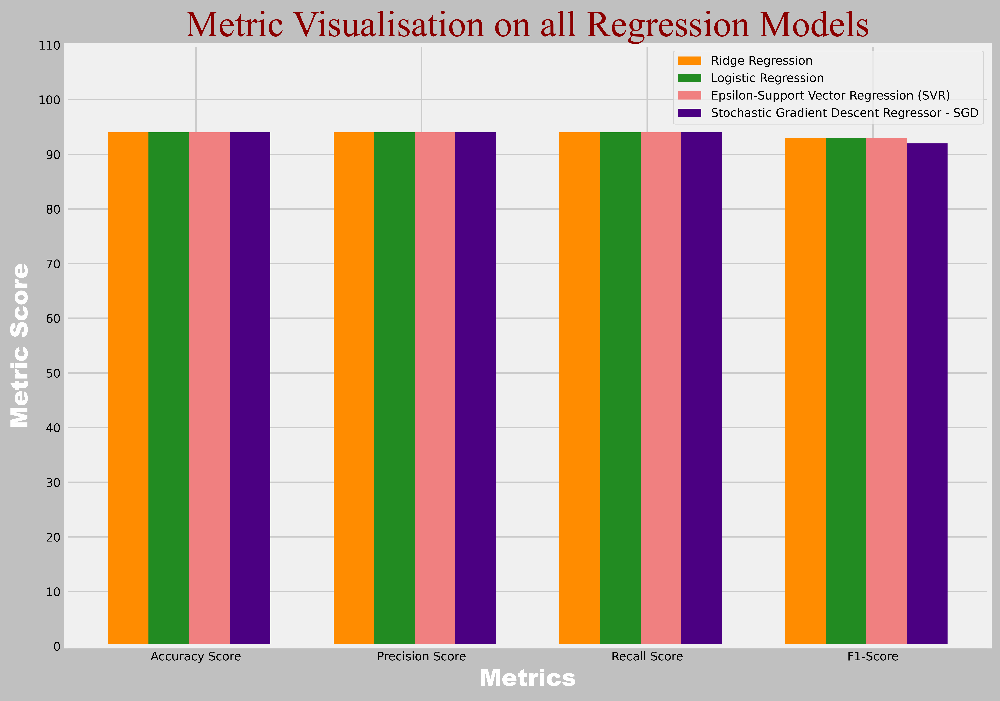

In [ ]:
ridge_reg_scores = (
    model_accuracy_scores[0], model_precision_scores[0], model_recall_scores[0], model_f1_scores[0],
)
lr_scores = (
    model_accuracy_scores[1], model_precision_scores[1], model_recall_scores[1], model_f1_scores[1],
)
svr_scores = (
    model_accuracy_scores[2], model_precision_scores[2], model_recall_scores[2], model_f1_scores[2],
)
sgd_reg_scores = (
    model_accuracy_scores[3], model_precision_scores[3], model_recall_scores[3], model_f1_scores[3],
)
x_grid = ["Accuracy Score", "Precision Score", "Recall Score", "F1-Score"]
y_grid = [value for value in range(0, 120, 10)]
xpos = np.arange(len(x_grid))
bar_width = .18

style.use("fivethirtyeight")
plt.rcParams["font.size"] = 8
plt.figure(figsize=(10, 7), dpi=700, facecolor="silver")
plt.title(  # Add a title to the graph (specify font parameters with the Argument: fontdict).
    "Metric Visualisation on all Regression Models",
    fontdict={
        "fontname": "Times New Roman",
        "fontsize": 25
    },
    color="darkred"
)
plt.bar(xpos, ridge_reg_scores, width=bar_width, color="darkorange", label="Ridge Regression")
plt.bar((xpos + 0.18), lr_scores, width=bar_width, color="forestgreen", label="Logistic Regression")
plt.bar(
    (xpos + 0.36), svr_scores, width=bar_width, color="lightcoral",
    label="Epsilon-Support Vector Regression (SVR)"
)
plt.bar(
    (xpos + 0.54), sgd_reg_scores, width=bar_width, color="indigo",
    label="Stochastic Gradient Descent Regressor - SGD"
)
plt.xlabel(  # Just like the "Function: plt.title()", this gives a title to the X-Axis.
    "Metrics",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.xticks((xpos + 0.3), x_grid)
plt.ylabel(  # Just like the "Function: plt.title()", this gives a title to the Y-Axis.
    "Metric Score",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.yticks(y_grid)
plt.legend()
plt.show()

<br>
<br>

## <center><u>Application of GridSearchCV on all Classifier Models</u></center>

In [ ]:
# ------------------------------------- GridSearchCV: Ridge Classifier ------------------------------------- #
ridge_model = RidgeClassifier()
ridge_param_grid = [
    {
        "fit_intercept": [False],
        "max_iter": np.linspace(start=100, stop=1000, num=11, dtype=int),
        "tol": np.logspace(start=-3, stop=-2, num=11),
        "solver": ["auto", "svd", "cholesky", "lsqr", "sparse_cg", "sag", "saga", "lbfgs"],
        "positive": [True]
    }
]

ridge_clf = GridSearchCV(estimator=ridge_model, param_grid=ridge_param_grid, cv=3, n_jobs=-1)
ridge_best_clf = ridge_clf.fit(df_features_train, df_labels_train)
ridge_best_model = ridge_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 1mins --------------------------------- #

In [ ]:
# ------------------------------ GridSearchCV: Multinomial Naive Bayes (MNB) ------------------------------- #
mnb_model = MultinomialNB()
mnb_param_grid = [
    {
        "alpha": np.logspace(start=0, stop=2, num=30),
        "force_alpha": [True, False],
        "fit_prior": [True, False]
    }
]

mnb_clf = GridSearchCV(estimator=mnb_model, param_grid=mnb_param_grid, cv=3, n_jobs=-1)
mnb_best_clf = mnb_clf.fit(df_features_train, df_labels_train)
mnb_best_model = mnb_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 5secs --------------------------------- #

In [ ]:
# -------------------------- GridSearchCV: C-Support Vector Classification (SVC) --------------------------- #
svc_model = SVC()
svc_param_grid = [
    {
        "C": np.logspace(start=-2, stop=3, num=7),
        "kernel": ["linear", "poly", "rbf", "sigmoid"],
        # "shrinking": [True, False],
        # "probability": [True, False],
        # "tol": np.logspace(start=-3, stop=-2, num=11),
        "max_iter": np.linspace(start=1000, stop=3000, num=11, dtype=int),
        "decision_function_shape": ["ovo", "ovr"]
        # "break_ties": [True, False]
    }
]

svc_clf = GridSearchCV(estimator=svc_model, param_grid=svc_param_grid, cv=3, n_jobs=-1)
svc_clf_best = svc_clf.fit(df_features_train, df_labels_train)
svc_best_model = svc_clf_best.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 15mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1

In [ ]:
# ----------------------- GridSearchCV: Stochastic Gradient Descent Classifier (SGD) ----------------------- #
sgd_model = SGDClassifier()
sgd_param_grid = [
    {
        "loss": ["hinge", "log_loss", "log", "modified_huber", "squared_hinge", "perceptron",
                 "squared_error", "huber", "epsilon_insensitive", "squared_epsilon_insensitive"],
        "penalty": ["l2", "l1", "elasticnet"],
        # "alpha": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        "fit_intercept": [True, False],
        "max_iter": np.linspace(start=1000, stop=3000, num=5, dtype=int),
        "shuffle": [True, False],
        "learning_rate": ["constant", "optimal", "invscaling", "adaptive"],
        "early_stopping": [True, False],
        # "warm_start": [True, False],
        "average": [True, False]
    }
]

sgd_clf = GridSearchCV(estimator=sgd_model, param_grid=sgd_param_grid, cv=3, n_jobs=-1)
sgd_best_clf = sgd_clf.fit(df_features_train, df_labels_train)
sgd_best_model = sgd_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 10mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
/opt/anaconda3/lib/python3.8/sit

<br>

## <center><u>Implementing Classifier Models</u></center>

In [ ]:
# The below output displays the best parameters to train with the Regression Models, and is copied on to the
classifier_best_models = [  # Regression models below...
    ridge_best_model, mnb_best_model, svc_best_model, sgd_best_model
]

for i, model in enumerate(classifier_best_models):
    print(f"|Model {(i + 1)}|: {model}")

|Model 1|: RidgeClassifier(fit_intercept=False, max_iter=100, positive=True, tol=0.001)
|Model 2|: MultinomialNB(force_alpha=True)
|Model 3|: SVC(C=21.544346900318846, decision_function_shape='ovo', max_iter=1000)
|Model 4|: SGDClassifier(max_iter=3000, penalty='elasticnet')


In [ ]:
# ----------------------------------------- Display Metric Result ------------------------------------------ #
models = {
    "Ridge Classifier": Ridge(fit_intercept=False, max_iter=100, positive=True, tol=0.001),
    "Multinomial Naive Bayes": MultinomialNB(force_alpha=True),
    "C-Support Vector Classification": SVC(C=21.544347, decision_function_shape="ovo", max_iter=1000),
    "Stochastic Gradient Descent Classifier": SGDClassifier(max_iter=3000, penalty="elasticnet")
}
model_accuracy_scores = []
model_precision_scores = []
model_recall_scores = []
model_f1_scores = []

for model_name, model in models.items():
    # print(model)

    model.fit(df_features_train, df_labels_train)

    model_prediction = model.predict(df_features_test)
    model_accuracy_score = accuracy_score(df_labels_test, model_prediction.round())
    model_precision_score = precision_score(df_labels_test, model_prediction.round(), average="weighted")
    model_recall_score = recall_score(df_labels_test, model_prediction.round(), average="weighted")
    model_f1_score = f1_score(df_labels_test, model_prediction.round(), average="weighted")

    model_accuracy_scores.append(int(model_accuracy_score * 100))
    model_precision_scores.append(int(model_precision_score * 100))
    model_recall_scores.append(int(model_recall_score * 100))
    model_f1_scores.append(int(model_f1_score * 100))

    print("Evaluation for: {model_name}".format(model_name=model_name).center(90, '_') + "\n" +
          "Model Type:      {model_type}".format(model_type=model) + "\n" +
          "Model Preiction: {model_prediction}".format(model_prediction=model_prediction.round()) + "\n\n" +

          "Accuracy Score:  {model_accuracy:%}".format(model_accuracy=model_accuracy_score) + "\n" +
          "Precision Score: {model_precision:%}".format(model_precision=model_precision_score) + "\n" +
          "Recall Score:    {model_recall:%}".format(model_recall=model_recall_score) + "\n" +
          "F1-Score:        {model_f1:%}".format(model_f1=model_f1_score) + "\n\n" +

          "{model_name} - Confusion Matrix:".format(model_name=model_name) + "\n" +
          "{m_confusion_matrix}".format(m_confusion_matrix=confusion_matrix(
              df_labels_test, model_prediction.round())
          ) + "\n\n" +

          "{model_name} - Classification Report:".format(model_name=model_name) + "\n" +
          "{m_class_report}".format(m_class_report=classification_report(
              df_labels_test, model_prediction.round())
          ) + "\n" +
          "THE END".center(90, '-'))
# ---------------------------------------------------------------------------------------------------------- #

_____________________________Evaluation for: Ridge Classifier_____________________________
Model Type:      Ridge(fit_intercept=False, max_iter=100, positive=True, tol=0.001)
Model Preiction: [0. 0. 0. ... 0. 0. 0.]

Accuracy Score:  94.903651%
Precision Score: 94.630557%
Recall Score:    94.903651%
F1-Score:        93.367112%

Ridge Classifier - Confusion Matrix:
[[3693    6]
 [ 195   50]]

Ridge Classifier - Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97      3699
           1       0.89      0.20      0.33       245

    accuracy                           0.95      3944
   macro avg       0.92      0.60      0.65      3944
weighted avg       0.95      0.95      0.93      3944

-----------------------------------------THE END------------------------------------------
_________________________Evaluation for: Multinomial Naive Bayes__________________________
Model Type:      MultinomialNB(force_alpha=True)
Model

<br>

## <center><u>Visualising the Metric Scores for all Classifier Models</u></center>

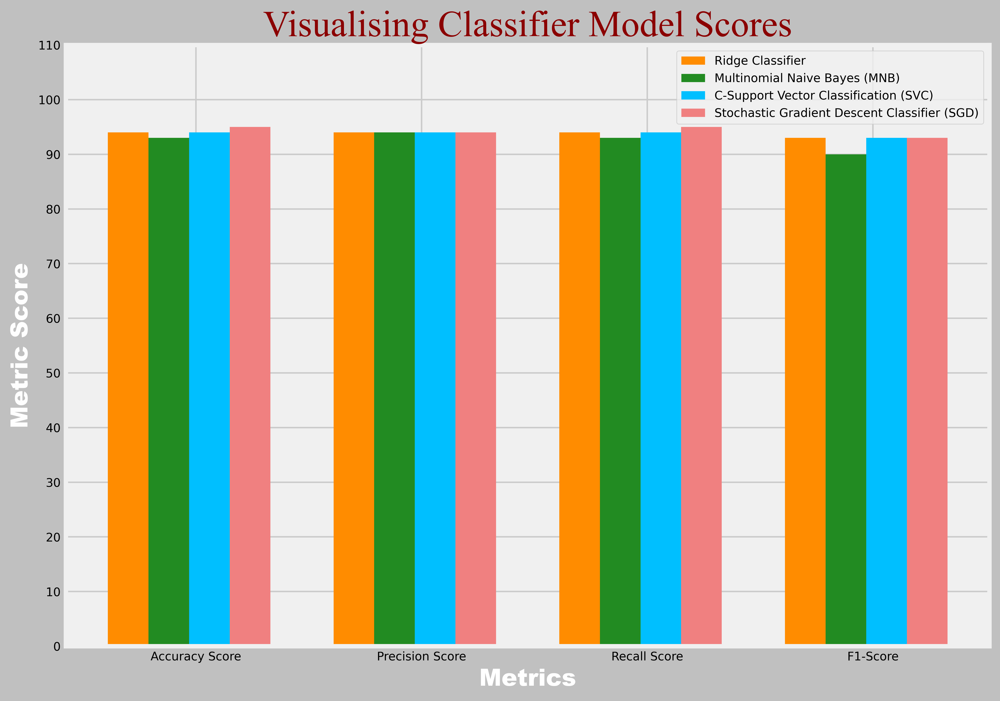

In [ ]:
ridge_scores = [
    model_accuracy_scores[0], model_precision_scores[0], model_recall_scores[0], model_f1_scores[0],
]
mnb_scores = [
    model_accuracy_scores[1], model_precision_scores[1], model_recall_scores[1], model_f1_scores[1],
]
svc_scores = [
    model_accuracy_scores[2], model_precision_scores[2], model_recall_scores[2], model_f1_scores[2],
]
sgd_scores = [
    model_accuracy_scores[3], model_precision_scores[3], model_recall_scores[3], model_f1_scores[3],
]
x_grid = ["Accuracy Score", "Precision Score", "Recall Score", "F1-Score"]
y_grid = [value for value in range(0, 120, 10)]
xpos = np.arange(len(x_grid))
bar_width = .18

style.use("fivethirtyeight")
plt.rcParams["font.size"] = 8
plt.figure(figsize=(10, 7), dpi=700, facecolor="silver")
plt.title(  # Add a title to the graph (specify font parameters with the Argument: fontdict).
    "Visualising Classifier Model Scores",
    fontdict={
        "fontname": "Times New Roman",
        "fontsize": 25
    },
    color="darkred"
)
plt.bar(xpos, ridge_scores, width=bar_width, color="darkorange", label="Ridge Classifier")
plt.bar(
    (xpos + 0.18), mnb_scores, width=bar_width, color="forestgreen", label="Multinomial Naive Bayes (MNB)"
)
plt.bar(
    (xpos + 0.36), svc_scores, width=bar_width, color="deepskyblue",
    label="C-Support Vector Classification (SVC)"
)
plt.bar(
    (xpos + 0.54), sgd_scores, width=bar_width, color="lightcoral",
    label="Stochastic Gradient Descent Classifier (SGD)"
)
plt.xlabel(  # Just like the "Function: plt.title()", this gives a title to the X-Axis.
    "Metrics",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.xticks((xpos + 0.3), x_grid)
plt.ylabel(  # Just like the "Function: plt.title()", this gives a title to the Y-Axis.
    "Metric Score",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.yticks(y_grid)
plt.legend()
plt.show()

<br>

## <center><u>Training with Additional Dataset</u></center>

In [ ]:
cyber_bullying_df = pd.read_csv("Cyber-Bullying.csv")

print("First 10 Elements from the 'Dataset - Cyber-Bullying.csv':")
print('-' * 85)
cyber_bullying_df.head(10)

First 10 Elements from the 'Dataset - Cyber-Bullying.csv':
-------------------------------------------------------------------------------------


,index,oh_label,Date,Text
0,0,1,20120618192155Z,"""You fuck your dad."""
1,1,0,20120528192215Z,"""i really don't understand your point.\xa0 It ..."
2,2,0,NaN,"""A\\xc2\\xa0majority of Canadians can and has ..."
3,3,0,NaN,"""listen if you dont wanna get married to a man..."
4,4,0,20120619094753Z,"""C\xe1c b\u1ea1n xu\u1ed1ng \u0111\u01b0\u1edd..."
5,5,0,20120620171226Z,"""@SDL OK, but I would hope they'd sign him to ..."
6,6,0,20120503012628Z,"""Yeah and where are you now?"""
7,7,1,NaN,"""shut the fuck up. you and the rest of your fa..."
8,8,1,20120502173553Z,"""Either you are fake or extremely stupid...may..."
9,9,1,20120620160512Z,"""That you are an idiot who understands neither..."


In [ ]:
print("Last 10 Elements from the 'Dataset - Cyber-Bullying.csv':")
print('-' * 85)
cyber_bullying_df.tail(10)

Last 10 Elements from the 'Dataset - Cyber-Bullying.csv':
-------------------------------------------------------------------------------------


,index,oh_label,Date,Text
8789,8789,1,20120612035445Z,"""Obviously the comic books you read have done ..."
8790,8790,0,20120611205255Z,"""since when does age have anything to do with ..."
8791,8791,0,20120528182752Z,"""nobody has arrested george w bush or dick che..."
8792,8792,1,20120619232505Z,"""Give up jamal jrk off, I would never possibly..."
8793,8793,0,20120529161303Z,"""Soon we will all be pledging allegiance to th..."
8794,8794,0,20120612003508Z,"""Never really gave it much thought. I just fig..."
8795,8795,0,20120619210456Z,"""Nadie se salva de la regla 34 xd"""
8796,8796,0,20120528234613Z,"""Question: Are you a boy or a girl?"""
8797,8797,1,20120619153537Z,"""Leave your email or phone number and maybe yo..."
8798,8798,0,20120620000237Z,"""From the scenarios you present, I see you bel..."


In [ ]:
# Dropping the "Columns: index and Date", since they are not required:
cyber_bullying_df.drop(["index", "Date"], axis=1, inplace=True)

print("First 10 Elements from the 'Dataset - Cyber-Bullying.csv':")
print('-' * 63)
cyber_bullying_df.head(10)

First 10 Elements from the 'Dataset - Cyber-Bullying.csv':
---------------------------------------------------------------


,oh_label,Text
0,1,"""You fuck your dad."""
1,0,"""i really don't understand your point.\xa0 It ..."
2,0,"""A\\xc2\\xa0majority of Canadians can and has ..."
3,0,"""listen if you dont wanna get married to a man..."
4,0,"""C\xe1c b\u1ea1n xu\u1ed1ng \u0111\u01b0\u1edd..."
5,0,"""@SDL OK, but I would hope they'd sign him to ..."
6,0,"""Yeah and where are you now?"""
7,1,"""shut the fuck up. you and the rest of your fa..."
8,1,"""Either you are fake or extremely stupid...may..."
9,1,"""That you are an idiot who understands neither..."


In [ ]:
print("Last 10 Elements from the 'Dataset - Cyber-Bullying.csv':")
print('-' * 63)
cyber_bullying_df.tail(10)

Last 10 Elements from the 'Dataset - Cyber-Bullying.csv':
---------------------------------------------------------------


,oh_label,Text
8789,1,"""Obviously the comic books you read have done ..."
8790,0,"""since when does age have anything to do with ..."
8791,0,"""nobody has arrested george w bush or dick che..."
8792,1,"""Give up jamal jrk off, I would never possibly..."
8793,0,"""Soon we will all be pledging allegiance to th..."
8794,0,"""Never really gave it much thought. I just fig..."
8795,0,"""Nadie se salva de la regla 34 xd"""
8796,0,"""Question: Are you a boy or a girl?"""
8797,1,"""Leave your email or phone number and maybe yo..."
8798,0,"""From the scenarios you present, I see you bel..."


In [ ]:
# Renaming the "Column: oh_label" to "Column: answer" and the "Column: Text" to the "Column: text":
cyber_bullying_df.rename(columns={"oh_label": "answer", "Text": "text"}, inplace=True)

cyber_bullying_df = cyber_bullying_df[["text", "answer"]]  # Repostioning the Columns...
cyber_bullying_df["Length"] = cyber_bullying_df.text.apply(len)

print("First 10 Elements from the 'Dataset - Cyber-Bullying.csv':")
print('-' * 63)
cyber_bullying_df.head(10)

First 10 Elements from the 'Dataset - Cyber-Bullying.csv':
---------------------------------------------------------------


,text,answer,Length
0,"""You fuck your dad.""",1,20
1,"""i really don't understand your point.\xa0 It ...",0,92
2,"""A\\xc2\\xa0majority of Canadians can and has ...",0,390
3,"""listen if you dont wanna get married to a man...",0,271
4,"""C\xe1c b\u1ea1n xu\u1ed1ng \u0111\u01b0\u1edd...",0,728
5,"""@SDL OK, but I would hope they'd sign him to ...",0,245
6,"""Yeah and where are you now?""",0,29
7,"""shut the fuck up. you and the rest of your fa...",1,89
8,"""Either you are fake or extremely stupid...may...",1,57
9,"""That you are an idiot who understands neither...",1,76


In [ ]:
print("Last 10 Elements from the 'Dataset - Cyber-Bullying.csv':")
print('-' * 63)
cyber_bullying_df.tail(10)

Last 10 Elements from the 'Dataset - Cyber-Bullying.csv':
---------------------------------------------------------------


,text,answer,Length
8789,"""Obviously the comic books you read have done ...",1,133
8790,"""since when does age have anything to do with ...",0,247
8791,"""nobody has arrested george w bush or dick che...",0,155
8792,"""Give up jamal jrk off, I would never possibly...",1,357
8793,"""Soon we will all be pledging allegiance to th...",0,72
8794,"""Never really gave it much thought. I just fig...",0,74
8795,"""Nadie se salva de la regla 34 xd""",0,34
8796,"""Question: Are you a boy or a girl?""",0,36
8797,"""Leave your email or phone number and maybe yo...",1,256
8798,"""From the scenarios you present, I see you bel...",0,1040


In [ ]:
# Combined "Datasets: Cyber-Bullying.csv and Formspring.csv" into one dataset:
new_df = pd.concat([cyber_bullying_df, formspring_df], axis=0)

# Stored the combined datasets into a "File: Datasets-Combined.csv":
new_df.to_csv("Datasets-Combined.csv", index=False)

new_df.answer = new_df.answer.replace(1, "Yes")
new_df.answer = new_df.answer.replace(0, "No")

In [ ]:
print("First 10 Elements from the 'Dataset - Datasets-Combined.csv':")
print('-' * 63)
new_df.head(10)

First 10 Elements from the 'Dataset - Datasets-Combined.csv':
---------------------------------------------------------------


,text,answer,Length
0,"""You fuck your dad.""",Yes,20
1,"""i really don't understand your point.\xa0 It ...",No,92
2,"""A\\xc2\\xa0majority of Canadians can and has ...",No,390
3,"""listen if you dont wanna get married to a man...",No,271
4,"""C\xe1c b\u1ea1n xu\u1ed1ng \u0111\u01b0\u1edd...",No,728
5,"""@SDL OK, but I would hope they'd sign him to ...",No,245
6,"""Yeah and where are you now?""",No,29
7,"""shut the fuck up. you and the rest of your fa...",Yes,89
8,"""Either you are fake or extremely stupid...may...",Yes,57
9,"""That you are an idiot who understands neither...",Yes,76


In [ ]:
print("Last 10 Elements from the 'Dataset - Datasets-Combined.csv':")
print('-' * 63)
new_df.tail(10)

Last 10 Elements from the 'Dataset - Datasets-Combined.csv':
---------------------------------------------------------------


,text,answer,Length
13137,Q: Your bio says &quot;Always ready for advent...,No,276
13138,Q: your going to mcdonalds what do you order ...,No,80
13139,Q: Your home alone. 2 robbers (of the opposite...,No,201
13140,Q: Your parents are divorced. One of them gets...,No,315
13141,Q: your thoughts on 2012? I think it&#039;ll b...,No,122
13142,Q: Youre at a party and your friend who drove ...,No,316
13143,Q: Youu2019re awesome :] Give yourself a compl...,No,105
13144,Q: Yu play with yurself ?<br>A: all the time. ...,No,76
13145,Q: yukk beer is disgusting. i can only drink i...,No,160
13146,Q: if i told u den it would make it all the le...,No,125


In [ ]:
print(f"The 'Dataset - Datasets-Combined.csv' has {new_df.shape[0]:,} rows and {new_df.shape[1]} columns.")

The 'Dataset - Datasets-Combined.csv' has 21,943 rows and 3 columns.


In [ ]:
new_df.drop_duplicates(inplace=True)

print(f"After removing duplcates, the 'Dataset - Datasets-Combined.csv' now has {new_df.shape[0]:,} rows and \
{new_df.shape[1]} columns.")

After removing duplcates, the 'Dataset - Datasets-Combined.csv' now has 21,892 rows and 3 columns.


In [ ]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21892 entries, 0 to 13146
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    21892 non-null  object
 1   answer  21892 non-null  object
 2   Length  21892 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 684.1+ KB


In [ ]:
new_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Length,21892.0,148.028869,280.672074,6.0,57.0,95.0,168.0,20030.0


In [ ]:
new_df.isnull().sum()

text      0
answer    0
Length    0
dtype: int64

In [ ]:
text_features = new_df.text.copy()
text_features = text_features.apply(preprocess)
new_df_features = tfid_vectorizer.fit_transform(text_features)

['fuck', 'dad']
['really', 'dont', 'understand', 'pointxa0', 'seems', 'mixing', 'apples', 'oranges']
['Axc2xa0majority', 'Canadians', 'wrong', 'againnnUnless', 'youre', 'supportive', 'idea', 'nothing', 'full', 'proof', 'perfect', 'take', 'chances', 'inadvertently', 'kill', 'son', 'daughter', 'thems', 'breaks', 'always', 'regard', 'collateral', 'damage', 'like', 'wartime', 'sorry', 'butxc2xa0the', 'cheques', 'mail']
['listen', 'dont', 'wanna', 'get', 'married', 'man', 'women', 'DONT', 'would', 'bother', 'gay', 'people', 'got', 'married', 'stay', 'lane', 'let', 'god', 'nice', 'quick', 'judg', 'like', 'thought', 'wasnt', 'suppose', 'judge', 'people']
['Cxe1c', 'bu1ea1n', 'xuu1ed1ng', 'u0111u01b0u1eddng', 'biu1ec3u', 'txecnh', '2011', 'cxf3', 'xf4n', 'hoxe0', 'khxf4ng', 'nCxe1c', 'ngu01b0', 'dxe2n', 'ngu1ed3i', 'cuxed', 'u0111u1ea7u', 'chiu1ee5', 'nhu1ee5c', 'cxf3', 'xf4n', 'hoxe0', 'khxf4ng', 'nCxe1c', 'nxf4ng', 'dxe2n', 'giu1eef', 'u0111u1ea5t', 'u1edf', 'Vu0103n', 'Giang', 'Cu1ea7n', 'T

In [ ]:
print("Text Features from the 'Pre-Processed Dataset - Datasets-Combined.csv':")
print('-' * 74)
print(text_features)

Text Features from the 'Pre-Processed Dataset - Datasets-Combined.csv':
--------------------------------------------------------------------------
0                                                fuck dad 
1        realli dont understand pointxa0 seem mix appl ...
2        axc2xa0major canadian wrong againnnunless your...
3        listen dont wanna get marri man women dont wou...
4        cxe1c bu1ea1n xuu1ed1ng u0111u01b0u1eddng biu1...
                               ...                        
13142    q your parti friend drove drunk won039t give k...
13143    q youu2019r awesom give compliment deserv itbr...
13144              q yu play yurself bra time sometim day 
13145    q yukk beer disgust drink i039m alreadi drunk ...
13146    q told u den would make less funbra would make...
Name: text, Length: 21892, dtype: object


In [ ]:
# Get specific column name:
column = ["answer"]

print("Column:", column)

Column: ['answer']


In [ ]:
for i in column:
    # print(i)

    new_df[i] = label_encoder.fit_transform(new_df[i])

print("Formspring Dataset Data Types:")
print('-' * 33)
print(new_df.dtypes)

Formspring Dataset Data Types:
---------------------------------
text      object
answer     int64
Length     int64
dtype: object


In [ ]:
print("First 10 Elements from the 'Dataset - Cyber-Bullying.csv':")
print('-' * 69)
new_df.head(10)

First 10 Elements from the 'Dataset - Cyber-Bullying.csv':
---------------------------------------------------------------------


,text,answer,Length
0,"""You fuck your dad.""",1,20
1,"""i really don't understand your point.\xa0 It ...",0,92
2,"""A\\xc2\\xa0majority of Canadians can and has ...",0,390
3,"""listen if you dont wanna get married to a man...",0,271
4,"""C\xe1c b\u1ea1n xu\u1ed1ng \u0111\u01b0\u1edd...",0,728
5,"""@SDL OK, but I would hope they'd sign him to ...",0,245
6,"""Yeah and where are you now?""",0,29
7,"""shut the fuck up. you and the rest of your fa...",1,89
8,"""Either you are fake or extremely stupid...may...",1,57
9,"""That you are an idiot who understands neither...",1,76


In [ ]:
print("Last 10 Elements from the 'Dataset - Cyber-Bullying.csv':")
print('-' * 69)
new_df.tail(10)

Last 10 Elements from the 'Dataset - Cyber-Bullying.csv':
---------------------------------------------------------------------


,text,answer,Length
13137,Q: Your bio says &quot;Always ready for advent...,0,276
13138,Q: your going to mcdonalds what do you order ...,0,80
13139,Q: Your home alone. 2 robbers (of the opposite...,0,201
13140,Q: Your parents are divorced. One of them gets...,0,315
13141,Q: your thoughts on 2012? I think it&#039;ll b...,0,122
13142,Q: Youre at a party and your friend who drove ...,0,316
13143,Q: Youu2019re awesome :] Give yourself a compl...,0,105
13144,Q: Yu play with yurself ?<br>A: all the time. ...,0,76
13145,Q: yukk beer is disgusting. i can only drink i...,0,160
13146,Q: if i told u den it would make it all the le...,0,125


<br>

## Testing and Training Dataframe

In [ ]:
new_df_text_features = pd.DataFrame(text_features)

new_df_text_features.to_csv("My Features (Combined Dataset).csv")

X_train, X_test, y_train, y_test = train_test_split(
    new_df_features, new_df["answer"], test_size=0.3, random_state=4861
)

In [ ]:
print("Dataframe Features Train:")
print('-' * 43)
print(X_train)

Dataframe Features Train:
-------------------------------------------
773      q one peopl doesnu2019t like chocolatebra yes ...
1998     ha ha ha that funni thank unwant promot timb07...
6203                      q like hairbra thank like glass 
5919                           time life tough right ahol 
7104     one bizarr opinion robert fuckingup presidenti...
                               ...                        
11764    q ever bulli bulli great amount elementari sha...
4551                q lol idk tell bra huh tell u wat lol 
7599                                        q debra thank 
2102     realli joexa0 ni dont recal anywher thexa0al c...
7113                   q havenapost answeraposdbra answer 
Name: text, Length: 15324, dtype: object


In [ ]:
print("Dataframe Features Test:")
print('-' * 53)
print(X_test)

Dataframe Features Test:
-----------------------------------------------------
                                                    text
5334                           famili drop dead instead 
4270   q v bad person could guy bra ha didnt think th...
6303   q id get teh hang day reckoni ha va eebra soun...
6881   get fact straight idiot 70 crim commit black p...
11054         q lmao meansbra search quotlmaoquot googl 
...                                                  ...
8429   q ever wonder mani peopl know leav stupidmess ...
4450   q fun wit question guyslolbra hahaha yup yup a...
7897                           realli bitter adam trade 
3969   q get cheat better busi bureau complain tobra ...
5119   fuck mate would make great kid stori like kid ...

[6568 rows x 1 columns]


In [ ]:
print("Dataframe Labels Train:")
print('-' * 27)
print(y_train)

Dataframe Labels Train:
---------------------------
773      0
1998     0
6203     0
5919     1
7104     0
        ..
11764    0
4551     0
7599     0
2102     1
7113     0
Name: answer, Length: 15324, dtype: int64


In [ ]:
print("Dataframe Labels Test:")
print('-' * 27)
print(y_test)

Dataframe Labels Test:
---------------------------
5334     1
4270     0
6303     0
6881     1
11054    0
        ..
8429     0
4450     0
7897     0
3969     0
5119     1
Name: answer, Length: 6568, dtype: int64


<br>
<br>

## <center><u>Application of GridSearchCV on all Regression Models</u></center>

In [ ]:
# ------------------------------------------ GridSearchCV: Ridge ------------------------------------------- #
ridge_reg_model = Ridge()
ridge_param_grid = [
    {
        "fit_intercept": [False],
        "max_iter": np.linspace(start=100, stop=1000, num=11, dtype=int),
        # "tol": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        "solver": ["auto", "svd", "cholesky", "lsqr", "sparse_cg", "sag", "saga", "lbfgs"],
        "positive": [True]
    }
]

ridge_reg_clf = GridSearchCV(estimator=ridge_reg_model, param_grid=ridge_param_grid, cv=3, n_jobs=-1)
ridge_reg_best_clf = ridge_reg_clf.fit(X_train, y_train)
ridge_reg_best_model = ridge_reg_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 10secs -------------------------------- #

In [ ]:
# ----------------------------------- GridSearchCV: Logistic Regression ------------------------------------ #
lr_model = LogisticRegression()
lr_param_grid = [
    {
        "penalty": ["l1", "l2", "elasticnet"],
        "dual": [True, False],
        "tol": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        # "C": np.logspace(start=-2, stop=3, num=7),
        "fit_intercept": [True, False],
        "solver": ["lbfgs", "liblinear", "newton-cg", "sag", "saga"],
        "max_iter": np.linspace(start=100, stop=1000, num=10, dtype=int),
        "multi_class": ["auto", "ovr", "multinomial"]
    }
]

lr_clf = GridSearchCV(estimator=lr_model, param_grid=lr_param_grid, cv=3, n_jobs=-1)
lr_best_clf = lr_clf.fit(X_train, y_train)
lr_best_model = lr_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 15mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter 

In [ ]:
# ------------------------- GridSearchCV: Epsilon-Support Vector Regression - SVR -------------------------- #
svr_model = SVR()
svr_param_grid = [
    {
        "kernel": ["linear", "poly", "rbf", "sigmoid"],
        # "tol": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        "C": np.logspace(start=-2, stop=3, num=7),
        "shrinking": [True, False],
        "max_iter": np.linspace(start=100, stop=3000, num=10, dtype=int)
    }
]

svr_clf = GridSearchCV(estimator=svr_model, param_grid=svr_param_grid, cv=3,n_jobs=-1)
svr_best_clf = svr_clf.fit(X_train, y_train)
svr_best_model = svr_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 30mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=100).

In [ ]:
# -------------------------- GridSearchCV: Stochastic Gradient Descent Regressor --------------------------- #
sgd_reg_model = SGDRegressor()
sgd_reg_param_grid = [
    {
        "loss": ["squared_error", "huber", "epsilon_insensitive", "squared_epsilon_insensitive"],
        "penalty": ["l2", "l1", "elasticnet"],
        "alpha": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        "fit_intercept": [True, False],
        "max_iter": np.linspace(start=1000, stop=3000, num=5, dtype=int),
        "shuffle": [True, False],
        "learning_rate": ["constant", "optimal", "invscaling", "adaptive"],
        "average": [True, False]
    }
]

sgd_reg_clf = GridSearchCV(estimator=sgd_reg_model, param_grid=sgd_reg_param_grid, cv=3, n_jobs=-1)
sgd_reg_best_clf = sgd_reg_clf.fit(X_train, y_train)
sgd_reg_best_model = sgd_reg_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 25mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linea

<br>

## <center><u>Implementing Regression Models</u></center>

In [ ]:
# The below output displays the best parameters to train with the Regression Models, and is copied on to the
regression_best_models = [  # Regression models below...
    ridge_reg_best_model, lr_best_model, svr_best_model, sgd_reg_best_model
]

for i, model in enumerate(regression_best_models):
    print(f"|Model {(i + 1)}|: {model}")

|Model 1|: Ridge(fit_intercept=False, max_iter=100, positive=True)
|Model 2|: LogisticRegression(max_iter=400, penalty='l1', solver='saga',
                   tol=0.08002000000000001)
|Model 3|: SVR(C=0.464158883361278, kernel='linear', max_iter=3000)
|Model 4|: SGDRegressor(learning_rate='adaptive', max_iter=2000)


In [ ]:
# ----------------------------------------- Display Metric Result ------------------------------------------ #
models = {
    "Ridge Regression": Ridge(fit_intercept=False, max_iter=100, positive=True),
    "Logistic Regression": LogisticRegression(max_iter=600, penalty="l1", solver="saga", tol=0.080020),
    "Epsilon-Support Vector Regression": SVR(C=0.464159, kernel="linear", max_iter=3000),
    "Stochastic Gradient Descent Regressor": SGDRegressor(learning_rate="adaptive", max_iter=2000)
}
model_accuracy_scores = []
model_precision_scores = []
model_recall_scores = []
model_f1_scores = []

for model_name, model in models.items():
    # print(model)

    model.fit(X_train, y_train)

    model_prediction = model.predict(X_test)
    model_accuracy_score = accuracy_score(y_test, model_prediction.round())
    model_precision_score = precision_score(y_test, model_prediction.round(), average="weighted")
    model_recall_score = recall_score(y_test, model_prediction.round(), average="weighted")
    model_f1_score = f1_score(y_test, model_prediction.round(), average="weighted")

    model_accuracy_scores.append(int(model_accuracy_score * 100))
    model_precision_scores.append(int(model_precision_score * 100))
    model_recall_scores.append(int(model_recall_score * 100))
    model_f1_scores.append(int(model_f1_score * 100))

    print("Evaluation for: {model_name}".format(model_name=model_name).center(97, '_') + "\n" +
          "Model Type:      {model_type}".format(model_type=model) + "\n" +
          "Model Preiction: {model_prediction}".format(model_prediction=model_prediction.round()) + "\n\n" +

          "Accuracy Score:  {model_accuracy:%}".format(model_accuracy=model_accuracy_score) + "\n" +
          "Precision Score: {model_precision:%}".format(model_precision=model_precision_score) + "\n" +
          "Recall Score:    {model_recall:%}".format(model_recall=model_recall_score) + "\n" +
          "F1-Score:        {model_f1:%}".format(model_f1=model_f1_score) + "\n\n" +

          "{model_name} - Confusion Matrix:".format(model_name=model_name) + "\n" +
          "{m_confusion_matrix}".format(m_confusion_matrix=confusion_matrix(
              y_test, model_prediction.round())) + "\n\n" +

          "{model_name} - Classification Report:".format(model_name=model_name) + "\n" +
          "{m_class_report}".format(m_class_report=classification_report(
              y_test, model_prediction.round())) + "\n" +
          "THE END".center(97, '-'))
# ---------------------------------------------------------------------------------------------------------- #

_________________________________Evaluation for: Ridge Regression________________________________
Model Type:      Ridge(fit_intercept=False, max_iter=100, positive=True)
Model Preiction: [0. 0. 0. ... 0. 0. 0.]

Accuracy Score:  88.383069%
Precision Score: 87.888532%
Recall Score:    88.383069%
F1-Score:        86.429578%

Ridge Regression - Confusion Matrix:
[[5408   79]
 [ 684  397]]

Ridge Regression - Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.99      0.93      5487
           1       0.83      0.37      0.51      1081

    accuracy                           0.88      6568
   macro avg       0.86      0.68      0.72      6568
weighted avg       0.88      0.88      0.86      6568

---------------------------------------------THE END---------------------------------------------
_______________________________Evaluation for: Logistic Regression_______________________________
Model Type:      LogisticRegression(max_iter

<br>

## <center><u>Visualising the Metric Scores for all Regression Models</u></center>

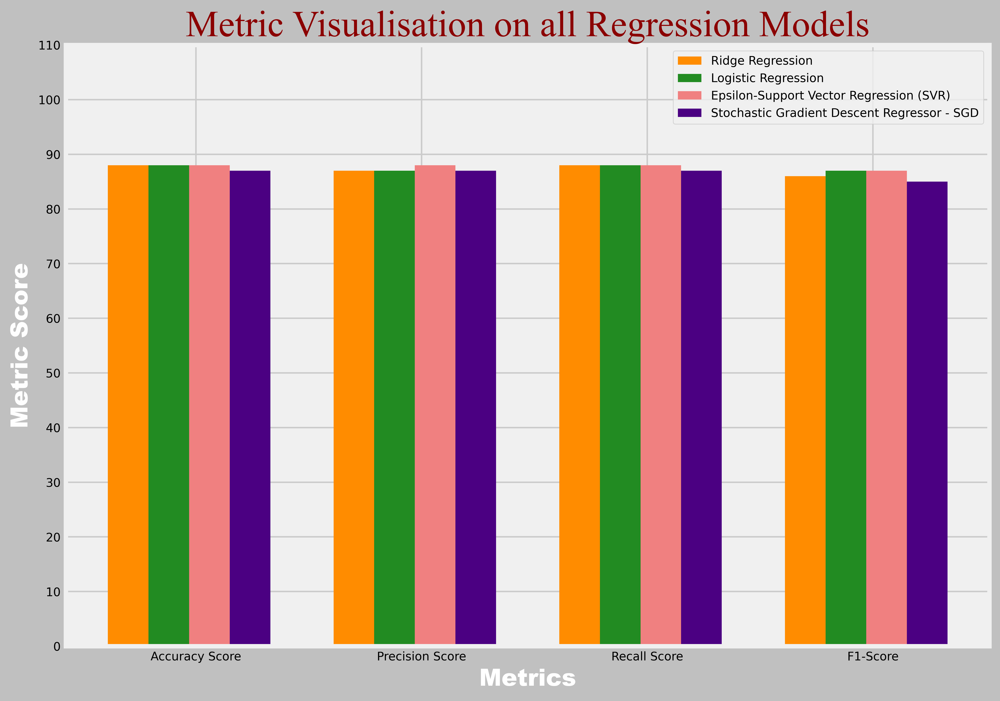

In [ ]:
ridge_reg_scores = (
    model_accuracy_scores[0], model_precision_scores[0], model_recall_scores[0], model_f1_scores[0],
)
lr_scores = (
    model_accuracy_scores[1], model_precision_scores[1], model_recall_scores[1], model_f1_scores[1],
)
svr_scores = (
    model_accuracy_scores[2], model_precision_scores[2], model_recall_scores[2], model_f1_scores[2],
)
sgd_reg_scores = (
    model_accuracy_scores[3], model_precision_scores[3], model_recall_scores[3], model_f1_scores[3],
)
x_grid = ["Accuracy Score", "Precision Score", "Recall Score", "F1-Score"]
y_grid = [value for value in range(0, 120, 10)]
xpos = np.arange(len(x_grid))
bar_width = .18

style.use("fivethirtyeight")
plt.rcParams["font.size"] = 8
plt.figure(figsize=(10, 7), dpi=700, facecolor="silver")
plt.title(  # Add a title to the graph (specify font parameters with the Argument: fontdict).
    "Metric Visualisation on all Regression Models",
    fontdict={
        "fontname": "Times New Roman",
        "fontsize": 25
    },
    color="darkred"
)
plt.bar(xpos, ridge_reg_scores, width=bar_width, color="darkorange", label="Ridge Regression")
plt.bar((xpos + 0.18), lr_scores, width=bar_width, color="forestgreen", label="Logistic Regression")
plt.bar(
    (xpos + 0.36), svr_scores, width=bar_width, color="lightcoral",
    label="Epsilon-Support Vector Regression (SVR)"
)
plt.bar(
    (xpos + 0.54), sgd_reg_scores, width=bar_width, color="indigo",
    label="Stochastic Gradient Descent Regressor - SGD"
)
plt.xlabel(  # Just like the "Function: plt.title()", this gives a title to the X-Axis.
    "Metrics",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.xticks((xpos + 0.3), x_grid)
plt.ylabel(  # Just like the "Function: plt.title()", this gives a title to the Y-Axis.
    "Metric Score",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.yticks(y_grid)
plt.legend()
plt.show()

<br>
<br>

## <center><u>Application of GridSearchCV on all Classifier Models</u></center>

In [ ]:
# ------------------------------------- GridSearchCV: Ridge Classifier ------------------------------------- #
ridge_model = RidgeClassifier()
ridge_param_grid = [
    {
        "fit_intercept": [False],
        "max_iter": np.linspace(start=100, stop=1000, num=11, dtype=int),
        "tol": np.logspace(start=-3, stop=-2, num=11),
        "solver": ["auto", "svd", "cholesky", "lsqr", "sparse_cg", "sag", "saga", "lbfgs"],
        "positive": [True]
    }
]

ridge_clf = GridSearchCV(estimator=ridge_model, param_grid=ridge_param_grid, cv=3, n_jobs=-1)
ridge_best_clf = ridge_clf.fit(X_train, y_train)
ridge_best_model = ridge_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 1mins --------------------------------- #

In [ ]:
# ------------------------------ GridSearchCV: Multinomial Naive Bayes (MNB) ------------------------------- #
mnb_model = MultinomialNB()
mnb_param_grid = [
    {
        "alpha": np.logspace(start=0, stop=2, num=30),
        "force_alpha": [True, False],
        "fit_prior": [True, False]
    }
]

mnb_clf = GridSearchCV(estimator=mnb_model, param_grid=mnb_param_grid, cv=3, n_jobs=-1)
mnb_best_clf = mnb_clf.fit(X_train, y_train)
mnb_best_model = mnb_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 5secs --------------------------------- #

In [ ]:
# -------------------------- GridSearchCV: C-Support Vector Classification (SVC) --------------------------- #
svc_model = SVC()
svc_param_grid = [
    {
        "C": np.logspace(start=-2, stop=3, num=7),
        "kernel": ["linear", "poly", "rbf", "sigmoid"],
        # "shrinking": [True, False],
        # "probability": [True, False],
        # "tol": np.logspace(start=-3, stop=-2, num=11),
        "max_iter": np.linspace(start=1000, stop=3000, num=11, dtype=int),
        "decision_function_shape": ["ovo", "ovr"]
        # "break_ties": [True, False]
    }
]

svc_clf = GridSearchCV(estimator=svc_model, param_grid=svc_param_grid, cv=3, n_jobs=-1)
svc_clf_best = svc_clf.fit(X_train, y_train)
svc_best_model = svc_clf_best.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 35mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1200).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1

In [ ]:
# ----------------------- GridSearchCV: Stochastic Gradient Descent Classifier (SGD) ----------------------- #
sgd_model = SGDClassifier()
sgd_param_grid = [
    {
        "loss": ["hinge", "log_loss", "log", "modified_huber", "squared_hinge", "perceptron",
                 "squared_error", "huber", "epsilon_insensitive", "squared_epsilon_insensitive"],
        "penalty": ["l2", "l1", "elasticnet"],
        # "alpha": np.linspace(start=0.0001, stop=0.1, num=11, dtype=float),
        "fit_intercept": [True, False],
        "max_iter": np.linspace(start=1000, stop=3000, num=5, dtype=int),
        "shuffle": [True, False],
        "learning_rate": ["constant", "optimal", "invscaling", "adaptive"],
        "early_stopping": [True, False],
        # "warm_start": [True, False],
        "average": [True, False]
    }
]

sgd_clf = GridSearchCV(estimator=sgd_model, param_grid=sgd_param_grid, cv=3, n_jobs=-1)
sgd_best_clf = sgd_clf.fit(X_train, y_train)
sgd_best_model = sgd_best_clf.best_estimator_
# -------------------------------- Estimated Parameter Search Time ≈ 10mins -------------------------------- #

/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_stochastic_gradient.py:163: FutureWarning: The loss 'log' was deprecated in v1.1 and will be removed in version 1.3. Use `loss='log_loss'` which is equivalent.
  warnings.warn(
/opt/anaconda3/lib/python3.8/sit

<br>

## <center><u>Implementing Classifier Models</u></center>

In [ ]:
# The below output displays the best parameters to train with the Regression Models, and is copied on to the
classifier_best_models = [  # Regression models below...
    ridge_best_model, mnb_best_model, svc_best_model, sgd_best_model
]

for i, model in enumerate(classifier_best_models):
    print(f"|Model {(i + 1)}|: {model}")

|Model 1|: RidgeClassifier(fit_intercept=False, max_iter=100, positive=True, tol=0.001)
|Model 2|: MultinomialNB(alpha=3.039195382313197, fit_prior=False, force_alpha=True)
|Model 3|: SVC(C=21.544346900318846, decision_function_shape='ovo', max_iter=2000)
|Model 4|: SGDClassifier(average=True, max_iter=1500)


In [ ]:
# ----------------------------------------- Display Metric Result ------------------------------------------ #
models = {
    "Ridge Classifier": Ridge(fit_intercept=False, max_iter=100, positive=True, tol=0.001),
    "Multinomial Naive Bayes": MultinomialNB(alpha=3.039195, fit_prior=False, force_alpha=True),
    "C-Support Vector Classification": SVC(C=21.544347, decision_function_shape="ovo", max_iter=2000),
    "Stochastic Gradient Descent Classifier": SGDClassifier(average=True, max_iter=3000)
}
model_accuracy_scores = []
model_precision_scores = []
model_recall_scores = []
model_f1_scores = []

for model_name, model in models.items():
    # print(model)

    model.fit(X_train, y_train)

    model_prediction = model.predict(X_test)
    model_accuracy_score = accuracy_score(y_test, model_prediction.round())
    model_precision_score = precision_score(y_test, model_prediction.round(), average="weighted")
    model_recall_score = recall_score(y_test, model_prediction.round(), average="weighted")
    model_f1_score = f1_score(y_test, model_prediction.round(), average="weighted")

    model_accuracy_scores.append(int(model_accuracy_score * 100))
    model_precision_scores.append(int(model_precision_score * 100))
    model_recall_scores.append(int(model_recall_score * 100))
    model_f1_scores.append(int(model_f1_score * 100))

    print("Evaluation for: {model_name}".format(model_name=model_name).center(90, '_') + "\n" +
          "Model Type:      {model_type}".format(model_type=model) + "\n" +
          "Model Preiction: {model_prediction}".format(model_prediction=model_prediction.round()) + "\n\n" +

          "Accuracy Score:  {model_accuracy:%}".format(model_accuracy=model_accuracy_score) + "\n" +
          "Precision Score: {model_precision:%}".format(model_precision=model_precision_score) + "\n" +
          "Recall Score:    {model_recall:%}".format(model_recall=model_recall_score) + "\n" +
          "F1-Score:        {model_f1:%}".format(model_f1=model_f1_score) + "\n\n" +

          "{model_name} - Confusion Matrix:".format(model_name=model_name) + "\n" +
          "{m_confusion_matrix}".format(m_confusion_matrix=confusion_matrix(
              y_test, model_prediction.round())) + "\n\n" +

          "{model_name} - Classification Report:".format(model_name=model_name) + "\n" +
          "{m_class_report}".format(m_class_report=classification_report(
              y_test, model_prediction.round())) + "\n" +
          "THE END".center(90, '-'))
# ---------------------------------------------------------------------------------------------------------- #

_____________________________Evaluation for: Ridge Classifier_____________________________
Model Type:      Ridge(fit_intercept=False, max_iter=100, positive=True, tol=0.001)
Model Preiction: [0. 0. 0. ... 0. 0. 0.]

Accuracy Score:  88.291717%
Precision Score: 87.793440%
Recall Score:    88.291717%
F1-Score:        86.284712%

Ridge Classifier - Confusion Matrix:
[[5409   78]
 [ 691  390]]

Ridge Classifier - Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.99      0.93      5487
           1       0.83      0.36      0.50      1081

    accuracy                           0.88      6568
   macro avg       0.86      0.67      0.72      6568
weighted avg       0.88      0.88      0.86      6568

-----------------------------------------THE END------------------------------------------
_________________________Evaluation for: Multinomial Naive Bayes__________________________
Model Type:      MultinomialNB(alpha=3.039195, fit_pri

<br>

## <center><u>Visualising the Metric Scores for all Classifier Models</u></center>

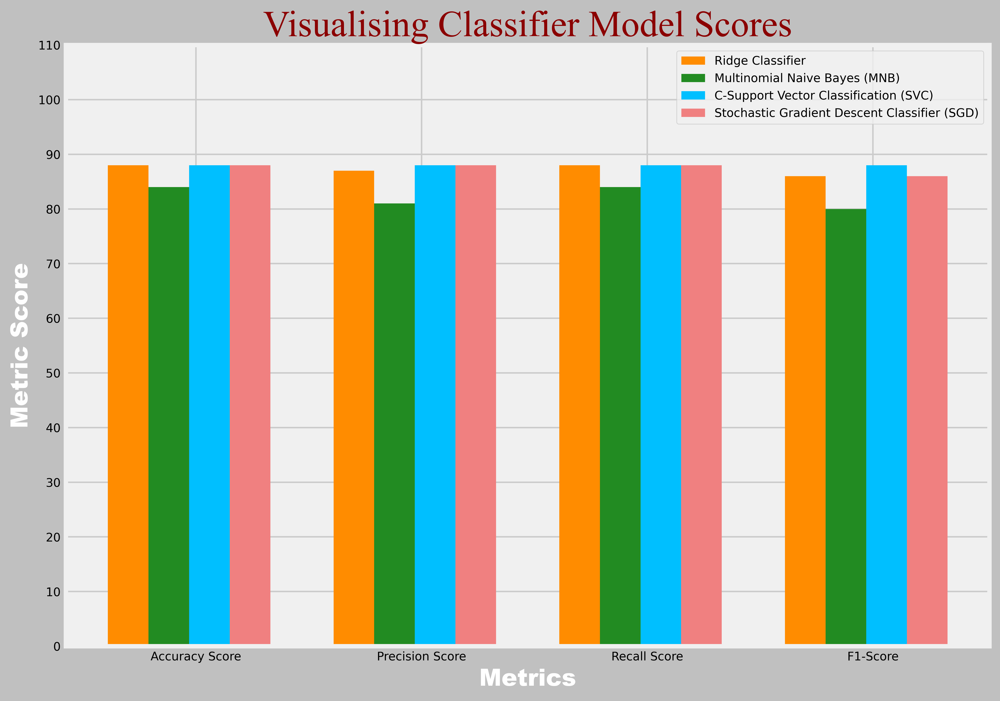

In [ ]:
ridge_scores = [
    model_accuracy_scores[0], model_precision_scores[0], model_recall_scores[0], model_f1_scores[0],
]
mnb_scores = [
    model_accuracy_scores[1], model_precision_scores[1], model_recall_scores[1], model_f1_scores[1],
]
svc_scores = [
    model_accuracy_scores[2], model_precision_scores[2], model_recall_scores[2], model_f1_scores[2],
]
sgd_scores = [
    model_accuracy_scores[3], model_precision_scores[3], model_recall_scores[3], model_f1_scores[3],
]
x_grid = ["Accuracy Score", "Precision Score", "Recall Score", "F1-Score"]
y_grid = [value for value in range(0, 120, 10)]
xpos = np.arange(len(x_grid))
bar_width = .1

style.use("fivethirtyeight")
plt.rcParams["font.size"] = 8
plt.figure(figsize=(10, 7), dpi=700, facecolor="silver")
plt.title(  # Add a title to the graph (specify font parameters with the Argument: fontdict).
    "Visualising Classifier Model Scores",
    fontdict={
        "fontname": "Times New Roman",
        "fontsize": 25
    },
    color="darkred"
)
plt.bar(xpos, ridge_scores, width=bar_width, color="darkorange", label="Ridge Classifier")
plt.bar(
    (xpos + 0.18), mnb_scores, width=bar_width, color="forestgreen", label="Multinomial Naive Bayes (MNB)"
)
plt.bar(
    (xpos + 0.36), svc_scores, width=bar_width, color="deepskyblue",
    label="C-Support Vector Classification (SVC)"
)
plt.bar(
    (xpos + 0.54), sgd_scores, width=bar_width, color="lightcoral",
    label="Stochastic Gradient Descent Classifier (SGD)"
)
plt.xlabel(  # Just like the "Function: plt.title()", this gives a title to the X-Axis.
    "Metrics",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.xticks((xpos + 0.3), x_grid)
plt.ylabel(  # Just like the "Function: plt.title()", this gives a title to the Y-Axis.
    "Metric Score",
    fontdict={
        "fontname": "Arial Black",
        "fontsize": 16
    },
    color="white"
)
plt.yticks(y_grid)
plt.legend()
plt.show()



#### ___<center><u>Output for the Evaluation Metrics with all Regression Models</u></center>___

|                 Models                  |         Metric Scores         |
|:---------------------------------------:|:-----------------------------:|
| ___Logistic Regression___               | _Accuracy Score: 98.205742%_  |
|                                         | _Precision Score: 98.189846%_ |
|                                         | _Recall Score: 98.205742%_    |
|                                         | _F1-Score: 98.178658%_        |
| ___Ridge___                             | _Accuracy Score: 97.787081%_  |
|                                         | _Precision Score: 97.871260%_ |
|                                         | _Recall Score: 97.787081%_    |
|                                         | _F1-Score: 97.744099%_        |
| ___Epsilon-Support Vector Regression___ | _Accuracy Score: 98.026316%_  |
|                                         | _Precision Score: 98.093254%_ |
|                                         | _Recall Score: 98.026316%_    |
|                                         | _F1-Score: 98.003810%_        |

<br>
<br>

#### ___<center><u>Output for the Evaluation Metrics with all Classifier Models</u></center>___

|                 Models                  |         Metric Scores         |
|:---------------------------------------:|:-----------------------------:|
| ___C-Support Vector Classifier___       | _Accuracy Score: 98.086124%_  |
|                                         | _Precision Score: 98.066456%_ |
|                                         | _Recall Score: 98.086124%_    |
|                                         | _F1-Score: 98.057235%_        |
| ___Decision Tree Classifier___          | _Accuracy Score: 97.009569%_  |
|                                         | _Precision Score: 96.962909%_ |
|                                         | _Recall Score: 97.009569%_    |
|                                         | _F1-Score: 96.976078%_        |
| ___Random Forest Classifier___          | _Accuracy Score: 97.428230%_  |
|                                         | _Precision Score: 97.502799%_ |
|                                         | _Recall Score: 97.428230%_    |
|                                         | _F1-Score: 97.315809%_        |


___Conclusion:___  


<br>
